In [1]:
import numpy as np
from veg_index import Image_Multi
import matplotlib.pyplot as plt

from matplotlib import path
import matplotlib.patches as patches
from skimage import draw
import scipy.ndimage as ndimage
import Utils
import cv2

/home/dlsaavedra/anaconda3/envs/new/lib/python3.7/site-packages/pysal/__init__.py:65: VisibleDeprecationWarning: PySAL's API will be changed on 2018-12-31. The last release made with this API is version 1.14.4. A preview of the next API version is provided in the `pysal` 2.0 prelease candidate. The API changes and a guide on how to change imports is provided at https://migrating.pysal.org
  ), VisibleDeprecationWarning)


# Load  Image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

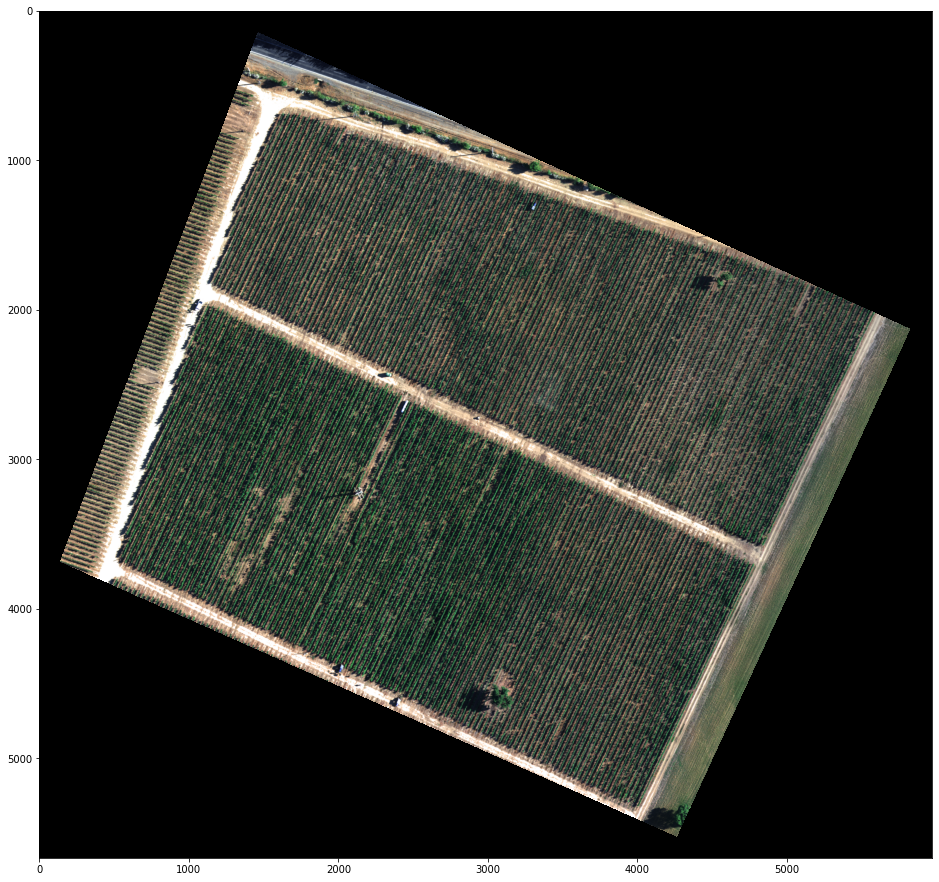

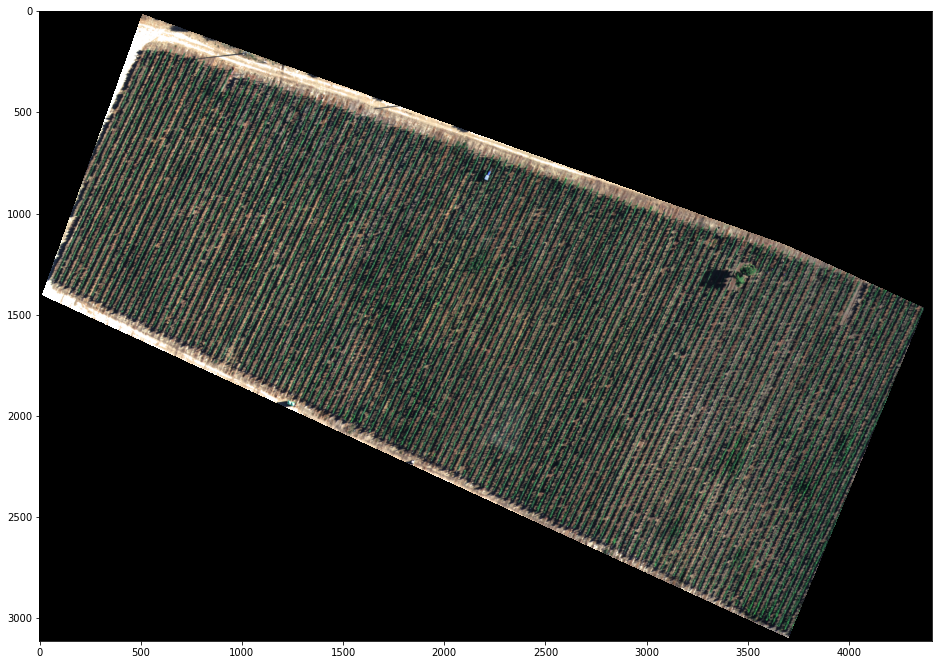

In [2]:
im_red_path = "Barrack A/result_Red.tif"
im_green_path = "Barrack A//result_Green.tif"
im_blue_path = "Barrack A/result_Blue.tif"
im_nir_path = "Barrack A/result_NIR.tif"
im_rededge_path = "Barrack A/result_RedEdge.tif"

im_multi = Image_Multi(im_red_path, im_green_path, im_blue_path, im_nir_path, im_rededge_path)

List_P = [(1600, 500),(4800, 3600), (1100, 1900), (5500, 1900)]
#List_P = [(500, 3700), (1000, 1900), (4900, 3600), (4000, 5500)]

im_multi_seg = im_multi.Segmentation(List_P)

plt.figure(0)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi.RGB().raster)

plt.figure(1)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)


# Split Image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


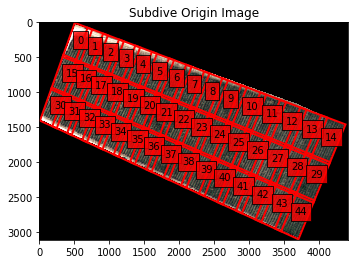

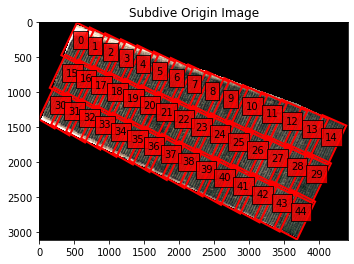

In [3]:
split_Weight, split_Height = 15, 3
overlap = 0.01

List_subdivide = im_multi_seg.subdivision_rect(split_Weight, split_Height, overlap)
List_subdivide_correct = im_multi_seg.correction_subimage(List_subdivide)

plt.figure(0)
plt.imshow(im_multi_seg.RGB().raster.copy())
plt.title('Subdive Origin Image')
ax = plt.gca()

for i,Poly in enumerate(List_subdivide):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     fill = False)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)
    
    
plt.figure(1)
plt.imshow(im_multi_seg.RGB().raster.copy())
plt.title('Subdive Origin Image')
ax = plt.gca()

for i,Poly in enumerate(List_subdivide_correct):
    
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     fill = False)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)

# Detect Lines

/home/dlsaavedra/Desktop/Rentadrone.cl-ai-test&SomeCode/Precision_Farming/veg_index.py:224: RuntimeWarning: invalid value encountered in greater
  H2 = (NDVI > th_NDVI).astype('uint8')
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

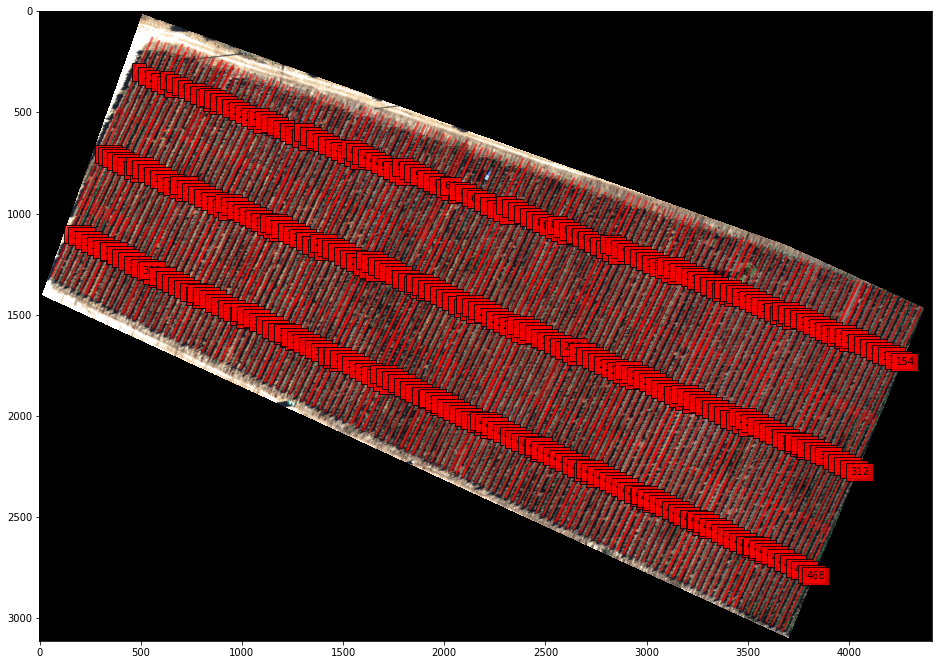

In [4]:
th_NDVI = 0.6
vertical_kernel_size_h = 10
vertical_kernel_size_w = 5
th_small_areas = 30
lines_width = 1
merge_bt_line = 10


List_lines_origin_complete = im_multi_seg.detector_lines(List_subdivide_correct,
                                                        th_NDVI,
                                                        vertical_kernel_size_h,
                                                        vertical_kernel_size_w,
                                                        th_small_areas,
                                                        lines_width,
                                                        merge_bt_line)

    
plt.figure(0)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)

ax = plt.gca()


for i,Poly in enumerate(List_lines_origin_complete):
    poly = patches.Polygon(Poly,
                     linewidth=2,
                     edgecolor='red',
                     alpha=0.5,
                     fill = True)
    plt.text(np.mean([x[0]  for x in Poly]), np.mean([y[1]  for y in Poly]) , str(i),  bbox=dict(facecolor='red', alpha=0.8))

    ax.add_patch(poly)

# Put Circle on Lines

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

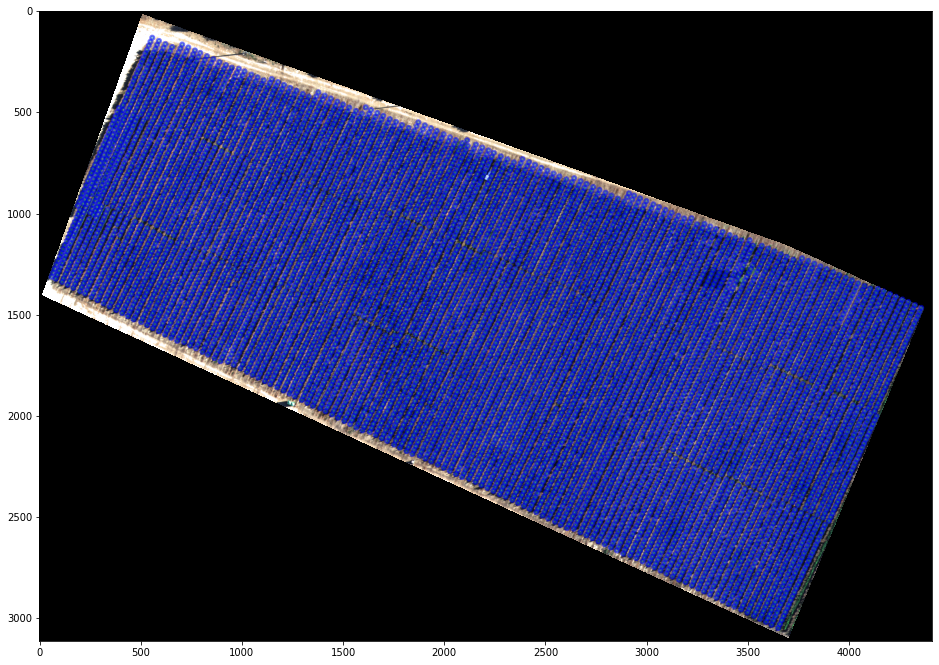

In [5]:
r_circle = 10
centers_circles = Utils.lines2circles(List_lines_origin_complete, r_circle)

#### Save Result###########
np.save('Barrack A/centers_circles.npy', centers_circles)
#centers_circles = np.load('Barrack A/centers_circles.npy')


plt.figure(0)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)

ax = plt.gca()


for x1, y1 in centers_circles[:,:]: 
    circle = patches.Circle((x1, y1), r_circle, 
                            linewidth=2,
                             edgecolor='blue',
                             alpha=0.5,
                             fill = True) 
    ax.add_patch(circle)

# The color of the circle depends on the NDVI

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

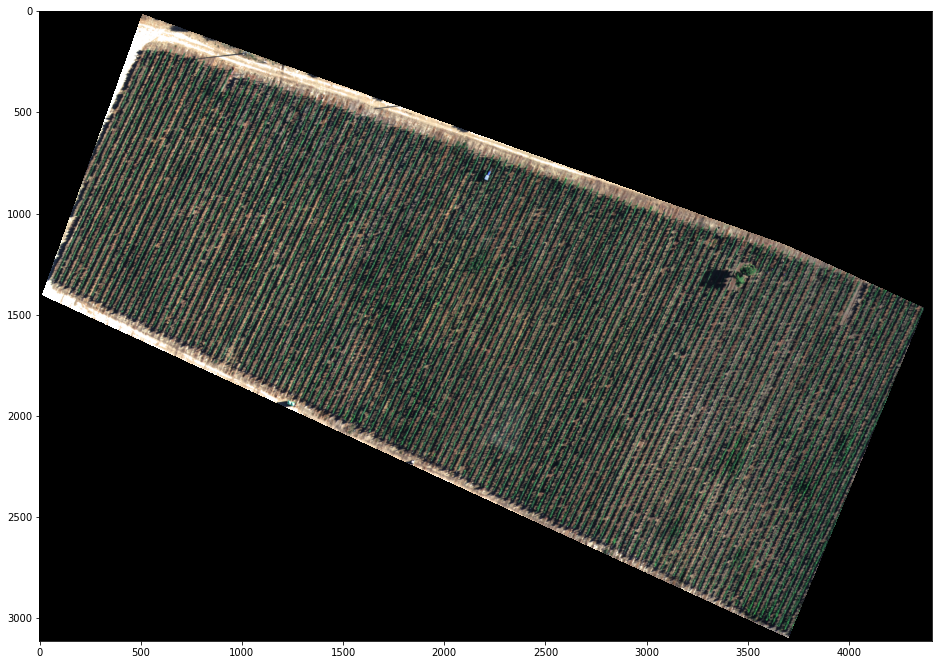

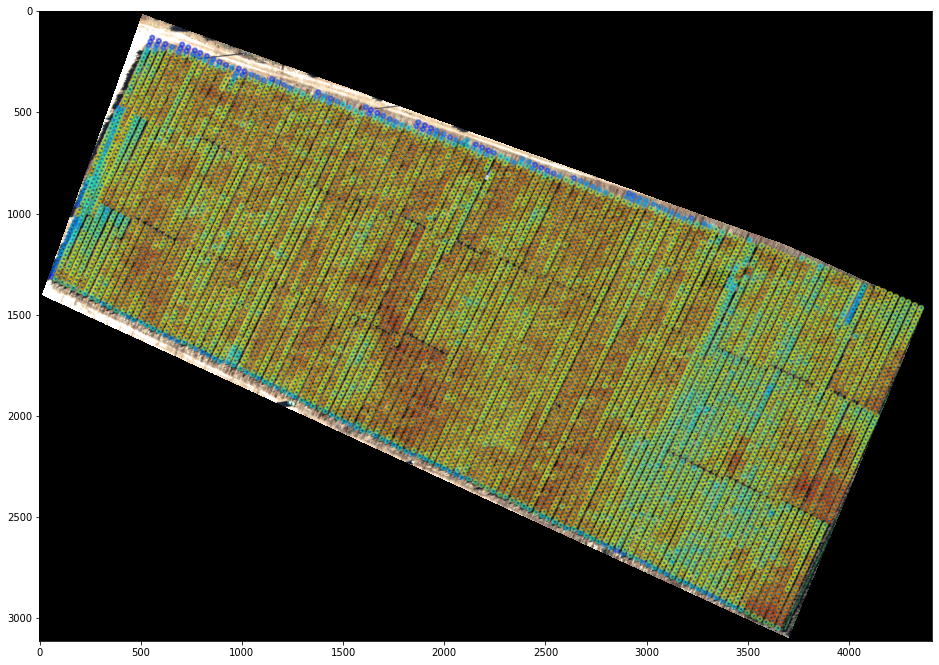

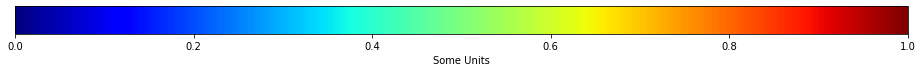

In [6]:

r_circle = 10
NDVI = im_multi_seg.NDVI().raster
NDVI_circle_index = []

for c in centers_circles:

    rr, cc = draw.disk((c[1], c[0]), radius=r_circle, shape=NDVI.shape)
    NDVI_circle_index.append(np.mean(NDVI[rr, cc]))

cmap = plt.cm.get_cmap("jet")
    
plt.figure(0)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)

ax = plt.gca()

plt.figure(1)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)
ax = plt.gca()

for i, (x1, y1) in enumerate(centers_circles[:,:]): 
    circle = patches.Circle((x1, y1), r_circle, 
                            linewidth=2,
                             edgecolor= cmap(NDVI_circle_index[i]),
                             alpha=0.5,
                             fill = True) 
    ax.add_patch(circle)
    
    
    
fig, ax = plt.subplots(figsize=(16, 1))
fig.subplots_adjust(bottom=0.5)

fig.colorbar(plt.cm.ScalarMappable(cmap=cmap),
             cax=ax, orientation='horizontal', label='Some Units')


In [ ]:
plt.hist(NDVI_circle_index)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

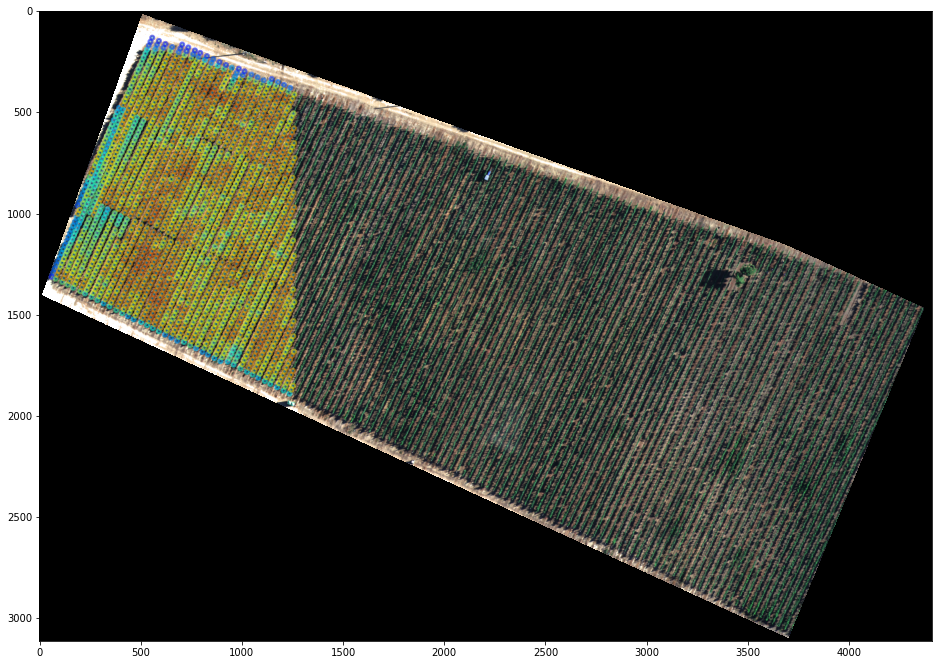

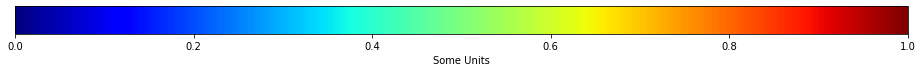

In [7]:
plt.figure(1)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)
ax = plt.gca()

for i, (x1, y1) in enumerate(centers_circles[:2000,:]): 
    circle = patches.Circle((x1, y1), r_circle, 
                            linewidth=2,
                             edgecolor= cmap(NDVI_circle_index[i]),
                             alpha=0.5,
                             fill = True) 
    ax.add_patch(circle)
    
    
    
fig, ax = plt.subplots(figsize=(16, 1))
fig.subplots_adjust(bottom=0.5)

fig.colorbar(plt.cm.ScalarMappable(cmap=cmap),
             cax=ax, orientation='horizontal', label='Some Units')


# The color of the circle depends on the OSAVI


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 432x288 with 0 Axes>

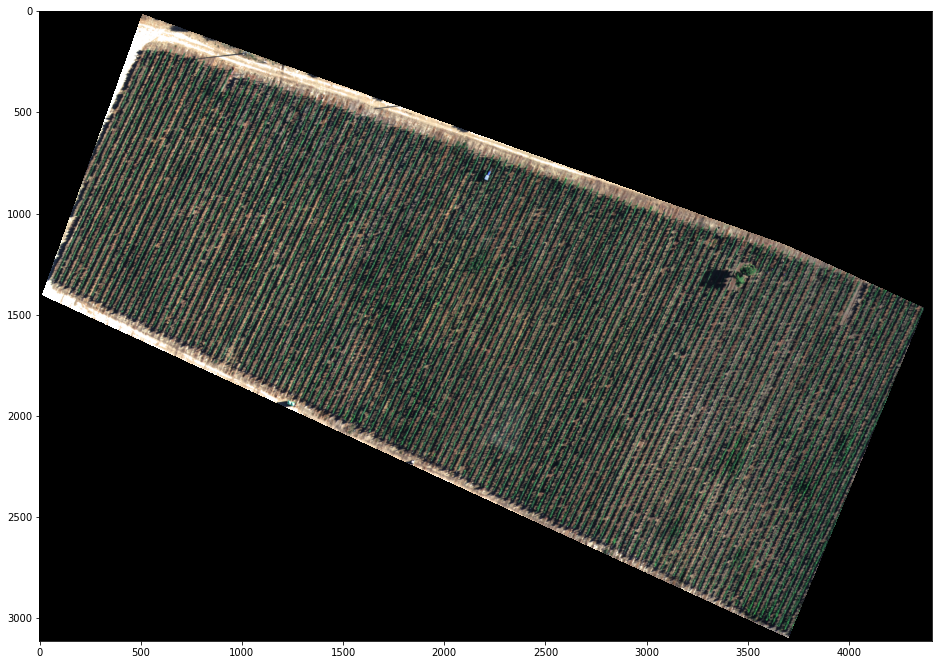

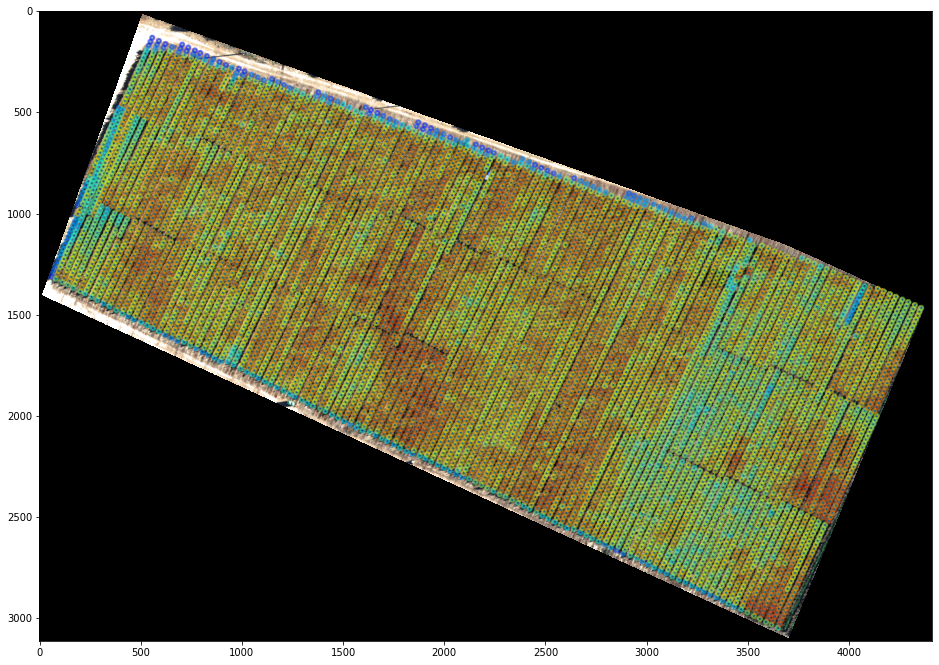

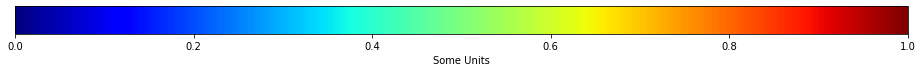

In [29]:

r_circle = 10
NDVI = im_multi_seg.OSAVI().raster
NDVI_circle_index = []

for c in centers_circles:

    rr, cc = draw.disk((c[1], c[0]), radius=r_circle, shape=NDVI.shape)
    NDVI_circle_index.append(np.mean(NDVI[rr, cc]))

cmap = plt.cm.get_cmap("jet")
    
plt.figure(0)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)

ax = plt.gca()

plt.figure(1)
plt.figure(figsize=(16, 16))
plt.imshow(im_multi_seg.RGB().raster)
ax = plt.gca()

for i, (x1, y1) in enumerate(centers_circles[:,:]): 
    circle = patches.Circle((x1, y1), r_circle, 
                            linewidth=2,
                             edgecolor= cmap(NDVI_circle_index[i]),
                             alpha=0.5,
                             fill = True) 
    ax.add_patch(circle)
    
    
    
fig, ax = plt.subplots(figsize=(16, 1))
fig.subplots_adjust(bottom=0.5)

fig.colorbar(plt.cm.ScalarMappable(cmap=cmap),
             cax=ax, orientation='horizontal', label='Some Units')


(array([  25.,   42.,   77.,   97.,  158.,  425., 1335., 2919., 2992.,
         518.]),
 array([0.07875583, 0.1558111 , 0.23286638, 0.30992166, 0.38697694,
        0.46403221, 0.54108749, 0.61814277, 0.69519805, 0.77225332,
        0.8493086 ]),
 <a list of 10 Patch objects>)

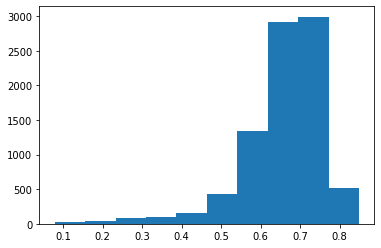

In [30]:
plt.hist(NDVI_circle_index)

(array([1.20000e+01, 3.60000e+01, 4.85000e+02, 1.83650e+04, 1.65093e+05,
        1.27967e+05, 1.45964e+05, 2.65676e+05, 4.35764e+05, 6.13360e+05,
        6.79724e+05, 5.43010e+05, 4.42292e+05, 4.50326e+05, 5.60383e+05,
        6.16464e+05, 5.76992e+05, 7.90715e+05, 3.33500e+05, 3.10560e+04]),
 array([-0.16326037, -0.10762437, -0.05198839,  0.00364761,  0.0592836 ,
         0.1149196 ,  0.17055559,  0.22619158,  0.28182757,  0.33746356,
         0.39309955,  0.44873556,  0.5043715 ,  0.5600075 ,  0.61564356,
         0.67127955,  0.72691554,  0.7825515 ,  0.8381875 ,  0.8938235 ,
         0.9494595 ], dtype=float32),
 <a list of 20 Patch objects>)

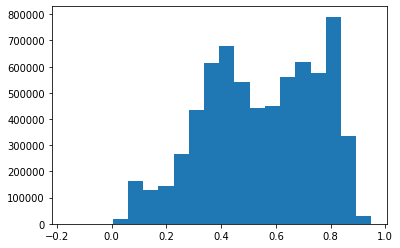

In [31]:
plt.hist(im_multi_seg.OSAVI().raster.ravel(), bins = 20)